In [20]:
import random
import matplotlib
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as keras
import seaborn as sns
import numpy as np
import pickle
from joblib import Parallel, delayed
from math import log2, ceil
import ardent
from scipy.ndimage import zoom

from proglearn.progressive_learner import ProgressiveLearner
from proglearn.deciders import SimpleArgmaxAverage
from proglearn.transformers import TreeClassificationTransformer, NeuralClassificationTransformer
from proglearn.voters import TreeClassificationVoter, KNNClassificationVoter
# from proglearn.sims import generate_gaussian_parity

In [2]:
from sklearn.datasets import make_blobs


def _generate_2d_rotation(theta=0):
    R = np.array([[np.cos(theta), np.sin(theta)], [-np.sin(theta), np.cos(theta)]])

    return R


def generate_gaussian_parity(
    n_samples,
    centers=None,
    class_label=None,
    cluster_std=0.25,
    angle_params=None,
    random_state=None,
):

    if random_state != None:
        np.random.seed(random_state)

    if centers == None:
        centers = np.array([(-0.5, 0.5), (0.5, 0.5), (-0.5, -0.5), (0.5, -0.5)])

    if class_label == None:
        class_label = [0, 1, 1, 0]

    blob_num = len(class_label)

    # get the number of samples in each blob with equal probability
    samples_per_blob = np.random.multinomial(
        n_samples, 1 / blob_num * np.ones(blob_num)
    )

    X, y = make_blobs(
        n_samples=samples_per_blob,
        n_features=2,
        centers=centers,
        cluster_std=cluster_std,
    )

    for blob in range(blob_num):
        y[np.where(y == blob)] = class_label[blob]

    if angle_params != None:
        R = _generate_2d_rotation(angle_params)
        X = X @ R

    return X, y

In [3]:
def experiment(n_task1, n_task2, n_test=1000, 
               task1_angle=0, task2_angle=np.pi/2, 
               n_trees=10, max_depth=None, random_state=None):
    
    """ 
    Returns
    -------
    errors : array of shape [6]
        Elements of the array is organized as single task error task1,
        multitask error task1, single task error task2,
        multitask error task2, naive UF error task1,
        naive UF task2.
    """

    if random_state != None:
        np.random.seed(random_state)

    errors = np.zeros(6,dtype=float)

    default_transformer_class = TreeClassificationTransformer
    default_transformer_kwargs = {"kwargs" : {"max_depth" : max_depth}}

    default_voter_class = TreeClassificationVoter
    default_voter_kwargs = {}

    default_decider_class = SimpleArgmaxAverage
    default_decider_kwargs = {"classes" : np.arange(2)}
    progressive_learner = ProgressiveLearner(default_transformer_class = default_transformer_class,
                                            default_transformer_kwargs = default_transformer_kwargs,
                                            default_voter_class = default_voter_class,
                                            default_voter_kwargs = default_voter_kwargs,
                                            default_decider_class = default_decider_class,
                                            default_decider_kwargs = default_decider_kwargs)
    uf = ProgressiveLearner(default_transformer_class = default_transformer_class,
                                            default_transformer_kwargs = default_transformer_kwargs,
                                            default_voter_class = default_voter_class,
                                            default_voter_kwargs = default_voter_kwargs,
                                            default_decider_class = default_decider_class,
                                            default_decider_kwargs = default_decider_kwargs)
    naive_uf = ProgressiveLearner(default_transformer_class = default_transformer_class,
                                            default_transformer_kwargs = default_transformer_kwargs,
                                            default_voter_class = default_voter_class,
                                            default_voter_kwargs = default_voter_kwargs,
                                            default_decider_class = default_decider_class,
                                            default_decider_kwargs = default_decider_kwargs)
    
    #source data
    X_task1, y_task1 = generate_gaussian_parity(n_task1, angle_params=task1_angle)
    test_task1, test_label_task1 = generate_gaussian_parity(n_test, angle_params=task1_angle)

    #target data
    X_task2, y_task2 = generate_gaussian_parity(n_task2, angle_params=task2_angle)
    test_task2, test_label_task2 = generate_gaussian_parity(n_test, angle_params=task2_angle)

    if n_task2 == 0:
        progressive_learner.add_task(X_task1, y_task1,
                                     num_transformers=n_trees)

        uf_task1=progressive_learner.predict(test_task1, 
                                             transformer_ids=[0], task_id=0)
        l2f_task1=progressive_learner.predict(test_task1, task_id=0)

        errors[0] = 1 - np.mean(uf_task1 == test_label_task1)
        errors[1] = 1 - np.mean(l2f_task1 == test_label_task1)
        
        errors[2] = 0.5
        errors[3] = 0.5
        
        errors[4] = 1 - np.mean(uf_task1 == test_label_task1)
        errors[5] = 0.5
    else:
        progressive_learner.add_task(X_task1, y_task1, num_transformers=n_trees)
        progressive_learner.add_task(X_task2, y_task2, num_transformers=n_trees)

        uf.add_task(X_task1, y_task1, num_transformers=2*n_trees)
        uf.add_task(X_task2, y_task2, num_transformers=2*n_trees)
        
        naive_uf_train_x = np.concatenate((X_task1,X_task2),axis=0)
        naive_uf_train_y = np.concatenate((y_task1,y_task2),axis=0)
        naive_uf.add_task(
                naive_uf_train_x, naive_uf_train_y, num_transformers=n_trees
                )
        
        uf_task1=uf.predict(test_task1, transformer_ids=[0], task_id=0)
        l2f_task1=progressive_learner.predict(test_task1, task_id=0)
        uf_task2=uf.predict(test_task2, transformer_ids=[1], task_id=1)
        l2f_task2=progressive_learner.predict(test_task2, task_id=1)
        naive_uf_task1 = naive_uf.predict(
            test_task1, transformer_ids=[0], task_id=0
        )
        naive_uf_task2 = naive_uf.predict(
            test_task2, transformer_ids=[0], task_id=0
        )

        errors[0] = 1 - np.mean(
            uf_task1 == test_label_task1
        )
        errors[1] = 1 - np.mean(
            l2f_task1 == test_label_task1
        )
        errors[2] = 1 - np.mean(
            uf_task2 == test_label_task2
        )
        errors[3] = 1 - np.mean(
            l2f_task2 == test_label_task2
        )
        errors[4] = 1 - np.mean(
            naive_uf_task1 == test_label_task1
        )
        errors[5] = 1 - np.mean(
            naive_uf_task2 == test_label_task2
        )

    return errors

In [4]:
mc_rep = 2
n_test = 1000
n_trees = 10
n_xor = (100*np.arange(0.5, 7.25, step=1)).astype(int)
n_rxor = (100*np.arange(0.5, 7.50, step=1)).astype(int)
# n_xor = [700]
# n_rxor = [750]

mean_error = np.zeros((6, len(n_xor)+len(n_rxor)))
std_error = np.zeros((6, len(n_xor)+len(n_rxor))) 

mean_te = np.zeros((4, len(n_xor)+len(n_rxor)))
std_te = np.zeros((4, len(n_xor)+len(n_rxor)))

for i,n1 in enumerate(n_xor):
    print('starting to compute %s xor\n'%n1)
    error = np.array(
        Parallel(n_jobs=-1,verbose=1)(
        delayed(experiment)(
            n1,0,task2_angle=np.pi/4,
            max_depth=ceil(log2(750))
        ) for _ in range(mc_rep)
      )
    )
    mean_error[:,i] = np.mean(error,axis=0)
    std_error[:,i] = np.std(error,ddof=1,axis=0)
    mean_te[0,i] = np.mean(error[:,0])/np.mean(error[:,1])
    mean_te[1,i] = np.mean(error[:,2])/np.mean(error[:,3])
    mean_te[2,i] = np.mean(error[:,0])/np.mean(error[:,4])
    mean_te[3,i] = np.mean(error[:,2])/np.mean(error[:,5])

    if n1==n_xor[-1]:
        for j,n2 in enumerate(n_rxor):
            print('starting to compute %s rxor\n'%n2)
            
            error = np.array(
                Parallel(n_jobs=-1,verbose=1)(
                delayed(experiment)(
                    n1,n2,task2_angle=np.pi/4,
                    max_depth=ceil(log2(750))
                ) for _ in range(mc_rep)
              )
            )
            mean_error[:,i+j+1] = np.mean(error,axis=0)
            std_error[:,i+j+1] = np.std(error,ddof=1,axis=0)
            mean_te[0,i+j+1] = np.mean(error[:,0])/np.mean(error[:,1])
            mean_te[1,i+j+1] = np.mean(error[:,2])/np.mean(error[:,3])
            mean_te[2,i+j+1] = np.mean(error[:,0])/np.mean(error[:,4])
            mean_te[3,i+j+1] = np.mean(error[:,2])/np.mean(error[:,5])

# with open('./data/mean_xor_rxor.pickle','wb') as f:
#     pickle.dump(mean_error,f)
    
# with open('./data/std_xor_rxor.pickle','wb') as f:
#     pickle.dump(std_error,f)
    
# with open('./data/mean_te_xor_rxor.pickle','wb') as f:
#     pickle.dump(mean_te,f)

starting to compute 50 xor

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
starting to compute 150 xor

[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    2.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
starting to compute 250 xor

[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    1.9s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    1.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
starting to compute 350 xor

[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    2.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   2 out of   2 |

Text(900, 0.6588248837316384, 'R-XOR')

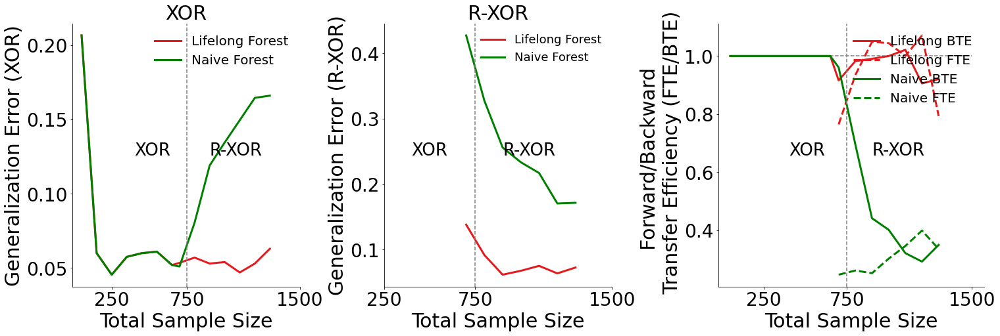

In [29]:
n1s = n_xor
n2s = n_rxor

ns = np.concatenate((n1s, n2s + n1s[-1]))
ls=['-', '--']
algorithms = ['XOR Forest', 'R-XOR Forest', 'Lifelong Forest', 'Naive Forest']

TASK1='XOR'
TASK2='R-XOR'

fontsize=30
labelsize=28

colors = sns.color_palette("Set1", n_colors = 2)

fig = plt.figure(constrained_layout=True,figsize=(21,7))
gs = fig.add_gridspec(7,21)
ax1 = fig.add_subplot(gs[:,:6])
# ax1.plot(n1s, mean_error[0,:len(n1s)], label=algorithms[0], c=colors[1], ls=ls[np.sum(0 > 1).astype(int)], lw=3)
# ax1.plot(ns[len(n1s):], mean_error[2, len(n1s):], label=algorithms[1], c=colors[1], ls=ls[1], lw=3)
ax1.plot(ns, mean_error[1], label=algorithms[2], c=colors[0], ls=ls[np.sum(1 > 1).astype(int)], lw=3)
ax1.plot(ns, mean_error[4], label=algorithms[3], c='g', ls=ls[np.sum(1 > 1).astype(int)], lw=3)

ax1.set_ylabel('Generalization Error (%s)'%(TASK1), fontsize=fontsize)
ax1.legend(loc='upper right', fontsize=20, frameon=False)
#ax1.set_ylim(0.09, 0.21)
ax1.set_xlabel('Total Sample Size', fontsize=fontsize)
ax1.tick_params(labelsize=labelsize)
#ax1.set_yticks([0.1,0.15, 0.2])
ax1.set_xticks([250,750,1500])
ax1.axvline(x=750, c='gray', linewidth=1.5, linestyle="dashed")
ax1.set_title('XOR', fontsize=30)

right_side = ax1.spines["right"]
right_side.set_visible(False)
top_side = ax1.spines["top"]
top_side.set_visible(False)

ax1.text(400, np.mean(ax1.get_ylim()), "%s"%(TASK1), fontsize=26)
ax1.text(900, np.mean(ax1.get_ylim()), "%s"%(TASK2), fontsize=26)

#####################################
ax1 = fig.add_subplot(gs[:,7:13])
# ax1.plot(n1s, mean_error[0,:len(n1s)], label=algorithms[0], c=colors[1], ls=ls[np.sum(0 > 1).astype(int)], lw=3)
# ax1.plot(ns[len(n1s):], mean_error[2, len(n1s):], label=algorithms[1], c=colors[1], ls=ls[1], lw=3)

ax1.plot(ns[len(n1s):], mean_error[3, len(n1s):], label=algorithms[2], c=colors[0], ls=ls[0], lw=3)
ax1.plot(ns[len(n1s):], mean_error[5, len(n1s):], label=algorithms[3], c='g', ls=ls[0], lw=3)

ax1.set_ylabel('Generalization Error (%s)'%(TASK2), fontsize=fontsize)
ax1.legend(loc='upper right', fontsize=18, frameon=False)
ax1.set_xlabel('Total Sample Size', fontsize=fontsize)
ax1.tick_params(labelsize=labelsize)
ax1.set_xticks([250,750,1500])
ax1.axvline(x=750, c='gray', linewidth=1.5, linestyle="dashed")


right_side = ax1.spines["right"]
right_side.set_visible(False)
top_side = ax1.spines["top"]
top_side.set_visible(False)

ax1.text(400, np.mean(ax1.get_ylim()), "%s"%(TASK1), fontsize=26)
ax1.text(900, np.mean(ax1.get_ylim()), "%s"%(TASK2), fontsize=26)

ax1.set_title('R-XOR', fontsize=30)

#####################################
algorithms = ['Lifelong BTE', 'Lifelong FTE', 'Naive BTE', 'Naive FTE']

ax1 = fig.add_subplot(gs[:,14:])

ax1.plot(ns, mean_te[0], label=algorithms[0], c=colors[0], ls=ls[0], lw=3)
ax1.plot(ns[len(n1s):], mean_te[1, len(n1s):], label=algorithms[1], c=colors[0], ls=ls[1], lw=3)
ax1.plot(ns, mean_te[2], label=algorithms[2], c='g', ls=ls[0], lw=3)
ax1.plot(ns[len(n1s):], mean_te[3, len(n1s):], label=algorithms[3], c='g', ls=ls[1], lw=3)

ax1.set_ylabel('Forward/Backward \n Transfer Efficiency (FTE/BTE)', fontsize=fontsize)
ax1.legend(loc='upper right', fontsize=20, frameon=False)
ax1.set_xlabel('Total Sample Size', fontsize=fontsize)
ax1.tick_params(labelsize=labelsize)
#ax1.set_yticks([0,.5,1,1.5])
ax1.set_xticks([250,750,1500])
ax1.axvline(x=750, c='gray', linewidth=1.5, linestyle="dashed")
right_side = ax1.spines["right"]
right_side.set_visible(False)
top_side = ax1.spines["top"]
top_side.set_visible(False)
ax1.hlines(1, 50,1500, colors='gray', linestyles='dashed',linewidth=1.5)

ax1.text(400, np.mean(ax1.get_ylim()), "%s"%(TASK1), fontsize=26)
ax1.text(900, np.mean(ax1.get_ylim()), "%s"%(TASK2), fontsize=26)

### apply lddmm

In [67]:
# seed_no = 3

In [3]:
def to_grid(X_task):
    h = 0.05
    x_min, x_max = X_task[:,0].min()-1, X_task[:,0].max()+1 
    y_min, y_max = X_task[:,1].min()-1, X_task[:,1].max()+1 
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    new_X_task = np.c_[xx.ravel(), yy.ravel()]
    return xx, yy, new_X_task

In [4]:
default_transformer_class = TreeClassificationTransformer
default_transformer_kwargs = {"kwargs" : {"max_depth" : 7}}

default_voter_class = TreeClassificationVoter
default_voter_kwargs = {}

default_decider_class = SimpleArgmaxAverage
default_decider_kwargs = {"classes" : np.arange(2)}
progressive_learner = ProgressiveLearner(default_transformer_class = default_transformer_class,
                                        default_transformer_kwargs = default_transformer_kwargs,
                                        default_voter_class = default_voter_class,
                                        default_voter_kwargs = default_voter_kwargs,
                                        default_decider_class = default_decider_class,
                                        default_decider_kwargs = default_decider_kwargs)

In [43]:
# np.random.seed(seed_no)
#source data
X_task1, y_task1 = generate_gaussian_parity(100, angle_params=0)
test_task1, test_label_task1 = generate_gaussian_parity(1000, angle_params=0)

#target data
X_task2, y_task2 = generate_gaussian_parity(100, angle_params=np.pi/4)
test_task2, test_label_task2 = generate_gaussian_parity(1000, angle_params=np.pi/4)

In [6]:
n_trees = 1
# np.random.seed(seed_no)
# progressive_learner.add_task(X_task1, y_task1, num_transformers=2*n_trees)
# progressive_learner.add_task(X_task2, y_task2, num_transformers=2*n_trees)
progressive_learner.add_task(X_task1, y_task1, num_transformers=n_trees)
progressive_learner.add_task(X_task2, y_task2, num_transformers=n_trees)

In [7]:
# UF

xx1, yy1, test_task1_grid = to_grid(test_task1)
l2f_task1 = progressive_learner.predict(test_task1_grid, task_id=0, transformer_ids=[0])
posteriors_task1 = l2f_task1[:,1].reshape(xx1.shape)

xx2, yy2, test_task2_grid = to_grid(test_task2)
l2f_task2 = progressive_learner.predict(test_task2_grid, task_id=1, transformer_ids=[1])
posteriors_task2 = l2f_task2[:,1].reshape(xx2.shape)

In [11]:
transform = ardent.Transform()
reference = posteriors_task1
moving = posteriors_task2
transform.register(target=moving, template=reference, affine_stepsize=0.1)
deformed_moving = transform.transform_image(
    subject=moving,
    output_shape=moving.shape,
    deform_to='template')

In [18]:
def aug_img(deformed_moving):
    scale = 1.5
    aug_deformed = zoom(deformed_moving, scale)
    # mid_pt = [aug_deformed.shape[0] // 2, aug_deformed.shape[1] // 2]
    # ori_shape = []
    x_ = deformed_moving.shape[0]
    y_ = deformed_moving.shape[1]
    aug_deformed = aug_deformed[
        x_//4 : x_//4+x_, y_//4 : y_//4+y_
    ]
    return aug_deformed
# plt.imshow(aug_deformed)
# plt.pcolormesh(xx2, yy2, aug_deformed)

In [9]:
context = sns.plotting_context(context="talk", font_scale=1)
sns.set_context(context)

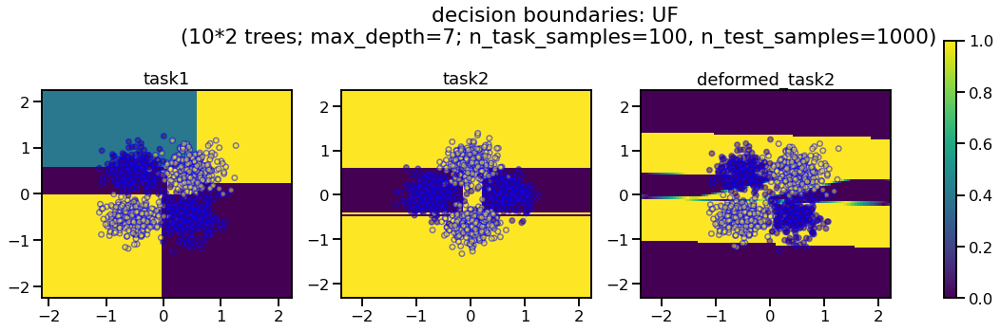

In [12]:
# fig,axs = plt.subplots(2,4, figsize=(25,5), gridspec_kw=dict(height_ratios=[1,8]))
fig,axs = plt.subplots(2,3, figsize=(20,5), gridspec_kw=dict(height_ratios=[1,8]))

# task 1 decision boundary
ax = axs[1,0]
ax.pcolormesh(xx1, yy1, posteriors_task1)
ax.scatter(test_task1[:,0], test_task1[:,1], c=test_label_task1, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx1.min(), xx1.max())
plt.ylim(yy1.min(), yy1.max())
ax.set(title="task1")

# task 2 decision boundary
ax = axs[1,1]
ax.pcolormesh(xx2, yy2, posteriors_task2)
# fig.colorbar(im)
ax.scatter(test_task2[:,0], test_task2[:,1], c=test_label_task2, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx2.min(), xx2.max())
plt.ylim(yy2.min(), yy2.max())
ax.set(title="task2")

# deformed task2 decision boundary
ax = axs[1,2]
im = ax.pcolormesh(xx2, yy2, deformed_moving)
# fig.colorbar(im)
ax.scatter(test_task1[:,0], test_task1[:,1], c=test_label_task1, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx2.min(), xx2.max())
plt.ylim(yy2.min(), yy2.max())
ax.set(title="deformed_task2")

# # augmented deformed task2 decision boundary
# ax = axs[1,3]
# aug_deformed = aug_img(deformed_moving)
# im = ax.pcolormesh(xx2, yy2, aug_deformed)
# # fig.colorbar(im)
# ax.scatter(test_task1[:,0], test_task1[:,1], c=test_label_task1, edgecolor='b', alpha=0.5, s=30)
# plt.xlim(xx2.min(), xx2.max())
# plt.ylim(yy2.min(), yy2.max())
# ax.set(title="augmented deformed_task2")

fig.colorbar(im, ax=axs.ravel().tolist())
plt.suptitle("decision boundaries: UF\n (10*2 trees; max_depth=7; n_task_samples=100, n_test_samples=1000)")
# plt.subplots_adjust(top=0.85)
# plt.tight_layout()
for i in range(3):
    ax = axs[0,i]
    ax.axis('off')

In [13]:
n_trees = 1
# np.random.seed(seed_no)
progressive_learner.add_task(X_task1, y_task1, num_transformers=n_trees)
progressive_learner.add_task(X_task2, y_task2, num_transformers=n_trees)

In [14]:
# L2F

xx1, yy1, test_task1_grid = to_grid(test_task1)
l2f_task1 = progressive_learner.predict(test_task1_grid, task_id=0)
posteriors_task1 = l2f_task1[:,1].reshape(xx1.shape)

xx2, yy2, test_task2_grid = to_grid(test_task2)
l2f_task2 = progressive_learner.predict(test_task2_grid, task_id=1)
posteriors_task2 = l2f_task2[:,1].reshape(xx2.shape)

In [15]:
transform = ardent.Transform()
reference = posteriors_task1
moving = posteriors_task2
transform.register(target=moving, template=reference, affine_stepsize=0.1)
deformed_moving = transform.transform_image(
    subject=moving,
    output_shape=moving.shape,
    deform_to='template')

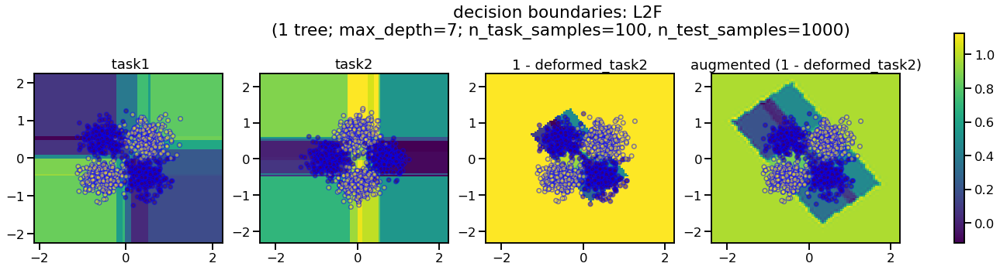

In [23]:
# fig,axs = plt.subplots(2,3, figsize=(20,5), gridspec_kw=dict(height_ratios=[1,8]))
fig,axs = plt.subplots(2,4, figsize=(25,5), gridspec_kw=dict(height_ratios=[1,8]))

# task 1 decision boundary
ax = axs[1,0]
im = ax.pcolormesh(xx1, yy1, posteriors_task1)
# plt.colorbar(im)
ax.scatter(test_task1[:,0], test_task1[:,1], c=test_label_task1, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx1.min(), xx1.max())
plt.ylim(yy1.min(), yy1.max())
ax.set(title="\n task1")

# task 2 decision boundary
ax = axs[1,1]
im = ax.pcolormesh(xx2, yy2, posteriors_task2)
# plt.colorbar(im)
ax.scatter(test_task2[:,0], test_task2[:,1], c=test_label_task2, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx2.min(), xx2.max())
plt.ylim(yy2.min(), yy2.max())
ax.set(title="task2")

# deformed task2 decision boundary
ax = axs[1,2]
im = ax.pcolormesh(xx2, yy2, 1-deformed_moving)
# plt.colorbar(im)
ax.scatter(test_task1[:,0], test_task1[:,1], c=test_label_task1, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx2.min(), xx2.max())
plt.ylim(yy2.min(), yy2.max())
ax.set(title="1 - deformed_task2")

# augmented deformed task2 decision boundary
ax = axs[1,3]
aug_deformed = aug_img(deformed_moving)
im = ax.pcolormesh(xx2, yy2, 1-aug_deformed)
# fig.colorbar(im)
ax.scatter(test_task1[:,0], test_task1[:,1], c=test_label_task1, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx2.min(), xx2.max())
plt.ylim(yy2.min(), yy2.max())
ax.set(title="augmented (1 - deformed_task2)")

fig.colorbar(im, ax=axs.ravel().tolist())
plt.suptitle("decision boundaries: L2F\n (1 tree; max_depth=7; n_task_samples=100, n_test_samples=1000)")

for i in range(4):
    ax = axs[0,i]
    ax.axis('off')

In [44]:
# RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# XOR
xx1, yy1, task1 = to_grid(X_task1)
clf = RandomForestClassifier()
p1 = clf.fit(X_task1, y_task1).predict_proba(task1)
posteriors_task1 = p1[:,1].reshape(xx1.shape)

# R-XOR
xx2, yy2, task2 = to_grid(X_task2)
clf = RandomForestClassifier(n_estimators=10, max_depth=7)
p2 = clf.fit(X_task2, y_task2).predict_proba(task2)
posteriors_task2 = p2[:,1].reshape(xx2.shape)

In [45]:
transform = ardent.Transform()
reference = posteriors_task1
moving = posteriors_task2
transform.register(target=moving, template=reference, affine_stepsize=0.1)
deformed_moving = transform.transform_image(
    subject=moving,
    output_shape=moving.shape,
    deform_to='template')

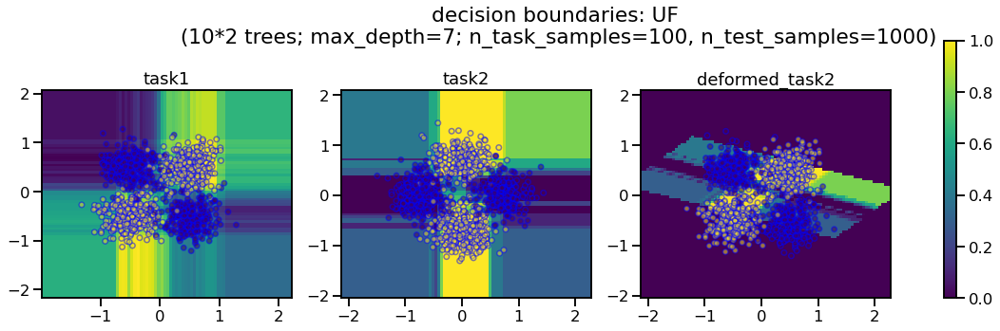

In [46]:
# fig,axs = plt.subplots(2,4, figsize=(25,5), gridspec_kw=dict(height_ratios=[1,8]))
fig,axs = plt.subplots(2,3, figsize=(20,5), gridspec_kw=dict(height_ratios=[1,8]))

# task 1 decision boundary
ax = axs[1,0]
ax.pcolormesh(xx1, yy1, posteriors_task1)
ax.scatter(test_task1[:,0], test_task1[:,1], c=test_label_task1, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx1.min(), xx1.max())
plt.ylim(yy1.min(), yy1.max())
ax.set(title="task1")

# task 2 decision boundary
ax = axs[1,1]
ax.pcolormesh(xx2, yy2, posteriors_task2)
# fig.colorbar(im)
ax.scatter(test_task2[:,0], test_task2[:,1], c=test_label_task2, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx2.min(), xx2.max())
plt.ylim(yy2.min(), yy2.max())
ax.set(title="task2")

# deformed task2 decision boundary
ax = axs[1,2]
im = ax.pcolormesh(xx2, yy2, deformed_moving)
# fig.colorbar(im)
ax.scatter(test_task1[:,0], test_task1[:,1], c=test_label_task1, edgecolor='b', alpha=0.5, s=30)
plt.xlim(xx2.min(), xx2.max())
plt.ylim(yy2.min(), yy2.max())
ax.set(title="deformed_task2")

# # augmented deformed task2 decision boundary
# ax = axs[1,3]
# aug_deformed = aug_img(deformed_moving)
# im = ax.pcolormesh(xx2, yy2, aug_deformed)
# # fig.colorbar(im)
# ax.scatter(test_task1[:,0], test_task1[:,1], c=test_label_task1, edgecolor='b', alpha=0.5, s=30)
# plt.xlim(xx2.min(), xx2.max())
# plt.ylim(yy2.min(), yy2.max())
# ax.set(title="augmented deformed_task2")

fig.colorbar(im, ax=axs.ravel().tolist())
plt.suptitle("decision boundaries: UF\n (10*2 trees; max_depth=7; n_task_samples=100, n_test_samples=1000)")
# plt.subplots_adjust(top=0.85)
# plt.tight_layout()
for i in range(3):
    ax = axs[0,i]
    ax.axis('off')